In [1]:
import os
from typing import List, Tuple
import csv

import librosa
import librosa.display
from librosa.util import peak_pick
from librosa.core import load
from librosa.onset import onset_detect, onset_backtrack
import sounddevice as sd
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
import mir_eval
from sklearn.model_selection import ParameterGrid
import pandas as pd
from tqdm import tqdm

from beat2d import settings, slicing

/home/jason/miniconda3/envs/beat2d/lib/python3.7/site-packages/torchaudio/backend/utils.py:54: UserWarning: "sox" backend is being deprecated. The default backend will be changed to "sox_io" backend in 0.8.0 and "sox" backend will be removed in 0.9.0. Please migrate to "sox_io" backend. Please refer to https://github.com/pytorch/audio/issues/903 for the detail.
  '"sox" backend is being deprecated. '


In [2]:
def read_sample(path: str):
    sample: np.ndarray
    sample, _ = load(path, settings.SAMPLE_RATE) # Load returns sample and sample rate
    return sample

In [3]:
def read_play_sample(path: str):
    sample = read_sample(path)
    sd.play(sample, settings.SAMPLE_RATE)
    sd.wait()

In [4]:
s = read_sample("../data/recordings/kicks.wav")

In [5]:
ipd.Audio(s, rate=settings.SAMPLE_RATE)

In [6]:
# We can convert the number of samples in the array to seconds by dividing by sample rate
s.shape[0] / settings.SAMPLE_RATE

61.79451247165533

In [7]:
# To convert to samples, do the opposite
10 * settings.SAMPLE_RATE

220500

In [8]:
def load_onset_labels(path):
    labels = []
    with open(path) as f:
        for l in f.readlines():
            time_label = l.split("\t")[0]
            labels.append(float(time_label))
    return labels

## Without peak picking

/home/jason/miniconda3/envs/beat2d/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/jason/miniconda3/envs/beat2d/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/jason/miniconda3/envs/beat2d/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


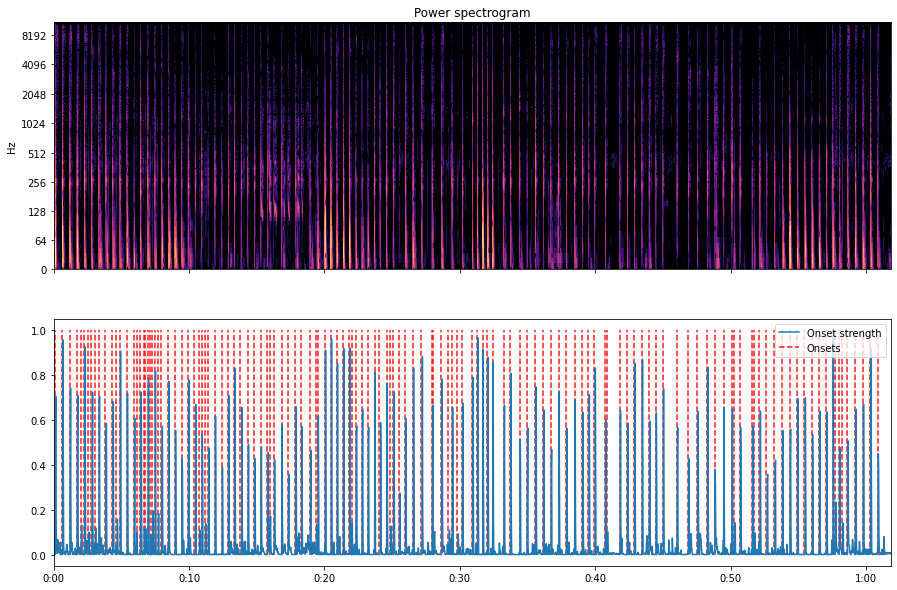

In [9]:
y = s

sr = settings.SAMPLE_RATE

o_env = librosa.onset.onset_strength(y, sr=sr)
times = librosa.times_like(o_env, sr=sr)
onset_frames = librosa.onset.onset_detect(onset_envelope=o_env, sr=sr, backtrack=True, units="frames")

D = np.abs(librosa.stft(y))
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(15, 10))
librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),
                         x_axis='time', y_axis='log', ax=ax[0])
ax[0].set(title='Power spectrogram')
ax[0].label_outer()
ax[1].plot(times, o_env, label='Onset strength')
ax[1].vlines(times[onset_frames], 0, o_env.max(), color='r', alpha=0.9,
           linestyle='--', label='Onsets')
ax[1].legend()

In [10]:
# Understanding where the onsets are with a click track
clicks = librosa.clicks(frames=onset_frames, sr=settings.SAMPLE_RATE, length=len(y))

In [11]:
ipd.Audio(y + clicks, rate=settings.SAMPLE_RATE)

## With Peak Picking

From manually listening to the track, I know there should be 20 peaks picked.

In [12]:
onset_frames_pp = librosa.util.peak_pick(o_env, 10, 10, 10, 10, 0.25, 5)

In [13]:
# Then we backtrack to capture the whole sample
onset_frames_pp_bt = onset_backtrack(onset_frames_pp, o_env)

/home/jason/miniconda3/envs/beat2d/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/jason/miniconda3/envs/beat2d/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/jason/miniconda3/envs/beat2d/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


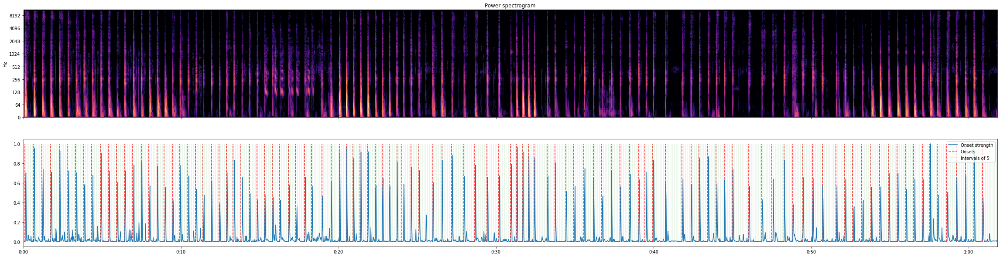

In [14]:
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(40, 10))
librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),
                         x_axis='time', y_axis='log', ax=ax[0])
ax[0].set(title='Power spectrogram')
ax[0].label_outer()
ax[1].plot(times, o_env, label='Onset strength')
ax[1].vlines(times[onset_frames_pp_bt], 0, o_env.max(), color='r', alpha=0.9,
           linestyle='--', label='Onsets')
ax[1].vlines(times[[x for x in range(0, len(times), 5)]], 0, o_env.max(), color='g', alpha=0.1,
           linestyle='-', label='Intervals of 5')
ax[1].legend()

In [15]:
# Understanding where the onsets are with a click track
clicks = librosa.clicks(frames=onset_frames_pp_bt, sr=settings.SAMPLE_RATE, length=len(y))

In [16]:
ipd.Audio(y + clicks, rate=settings.SAMPLE_RATE)

# Slicing

Just a simple slice from onset to onset.

In [17]:
def get_onsets(sample: np.ndarray, sr: int = settings.SAMPLE_RATE) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    onset_envelope = librosa.onset.onset_strength(sample, sr=sr)
    times = librosa.times_like(onset_envelope, sr=sr)

    onsets = librosa.util.peak_pick(onset_envelope, 10, 10, 10, 10, 0.25, 5)
    onsets = onset_backtrack(onsets, onset_envelope)
    
    return onsets

In [18]:
s = read_sample("../data/recordings/kicks.wav")
o = get_onsets(s)

In [19]:
def get_slices(sample: np.ndarray, sr: int = settings.SAMPLE_RATE) -> np.ndarray:
    # Calculate the onsets
    onsets = get_onsets(sample, sr)
    
    # Convert onset times to samples
    onset_samples = librosa.frames_to_samples(onsets)
    
    # Slice sample into separate samples by onsets
    slices: List[np.ndarray] = []
    
    # The first sample starts at the first onset
    prev_slice_pt: int = onset_samples[0]
    for slice_pt in onset_samples[1:]:
        slice_ = sample[prev_slice_pt:slice_pt]
        slices.append(slice_)
        prev_slice_pt = slice_pt
        
    # The last slice goes to the end of the audio
    slices.append(sample[onset_samples[-1]:])
    
    return slices

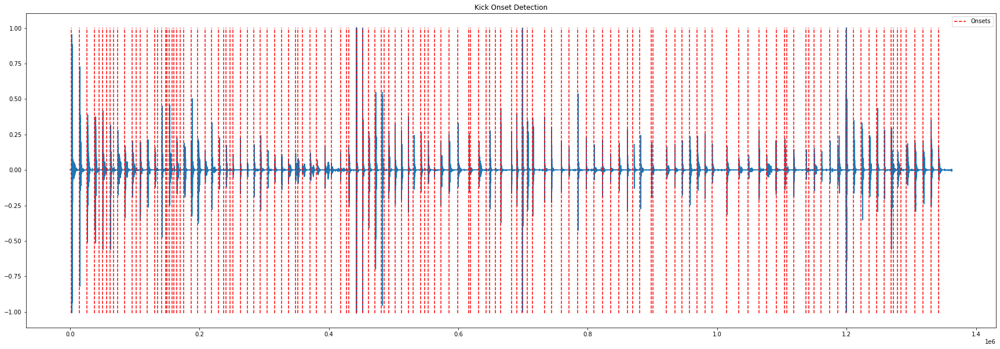

In [20]:
s = read_sample("../data/recordings/kicks.wav")

onsets = librosa.onset.onset_detect(
    s, 
    settings.SAMPLE_RATE, 
    backtrack=True, 
    units="samples")

plt.figure(figsize=(30,10))
plt.title("Kick Onset Detection")
plt.vlines(onsets, s.min(), s.max(), color='r',
           linestyle='--', label='Onsets', zorder=10)
plt.plot(s)
plt.legend()

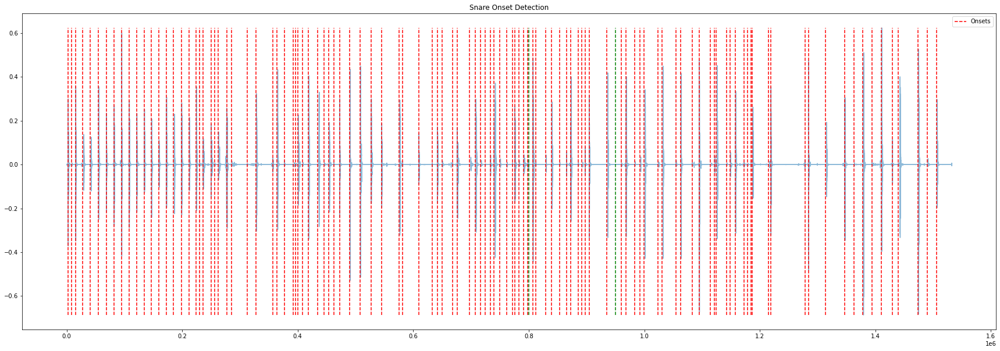

In [21]:
s = read_sample("../data/recordings/snare.wav")

onsets = librosa.onset.onset_detect(
    s, 
    settings.SAMPLE_RATE, 
    backtrack=True, 
    units="samples")

plt.figure(figsize=(30,10))
plt.title("Snare Onset Detection")
plt.vlines(onsets, s.min(), s.max(), color='r',
           linestyle='--', label='Onsets', zorder=10)
plt.vlines([800000, 950000], s.min(), s.max(), color='g',
           linestyle='--', zorder=10)
plt.plot(s, alpha=0.5)
plt.legend()

In [22]:
start = 800000
stop = 950000

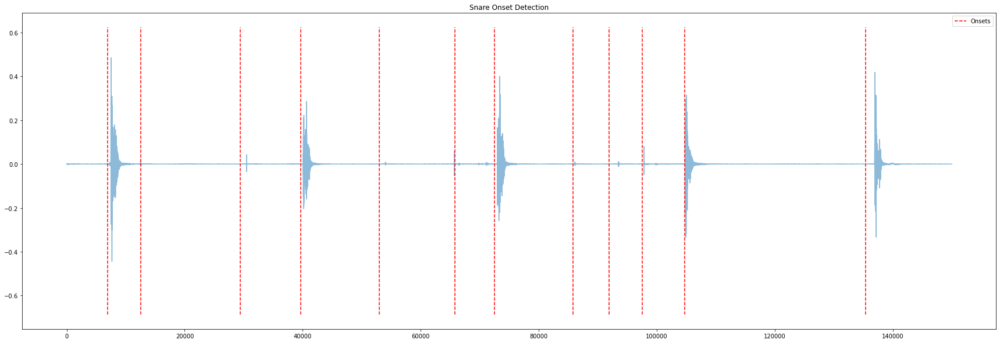

In [23]:
s = read_sample("../data/recordings/snare.wav")

onsets = librosa.onset.onset_detect(
    s, 
    settings.SAMPLE_RATE, 
    backtrack=True, 
    units="samples")

plt.figure(figsize=(30,10))
plt.title("Snare Onset Detection")
plt.vlines(onsets[(onsets > start) & (onsets < stop)] - start, s.min(), s.max(), color='r',
           linestyle='--', label='Onsets', zorder=10)
plt.plot(s[start:stop], alpha=0.5)
plt.legend()

In [24]:
ipd.Audio(s[start:stop], rate=settings.SAMPLE_RATE)

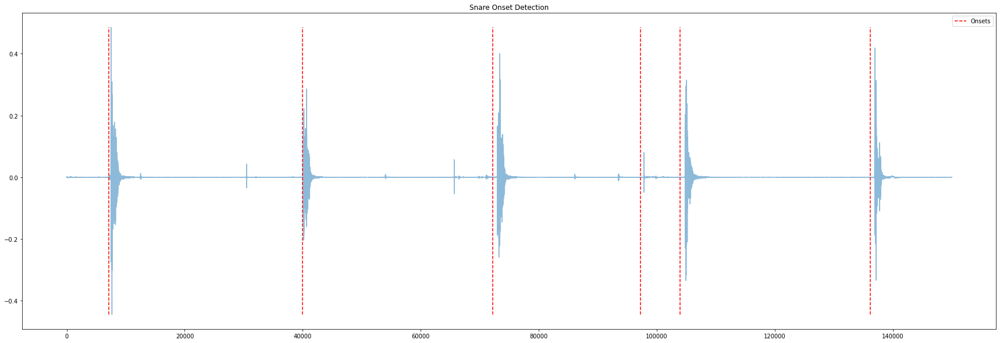

In [25]:
s = read_sample("../data/recordings/snare.wav")[start:stop]

onsets = librosa.onset.onset_detect(
    s, 
    settings.SAMPLE_RATE, 
    backtrack=True, 
    units="samples", 
    pre_max = 5,
    post_max = 2,
    pre_avg = 1,
    post_avg = 5,
    delta = 0.3,
    wait = 5)

plt.figure(figsize=(30,10))
plt.title("Snare Onset Detection")
plt.vlines(onsets, s.min(), s.max(), color='r',
           linestyle='--', label='Onsets', zorder=10)
plt.plot(s, alpha=0.5)
plt.legend()

In [26]:
ipd.Audio(s, rate=settings.SAMPLE_RATE)

In [27]:
onsets

array([  7168,  39936,  72192,  97280, 103936, 136192])

In [28]:
onsets

array([  7168,  39936,  72192,  97280, 103936, 136192])

In [29]:
7e6

7000000.0

In [30]:
s = read_sample("../data/recordings/kicks.wav")
slices = get_slices(s)

In [31]:
ipd.Audio(slices[24], rate=settings.SAMPLE_RATE)

`get_onsets` and `get_slices` have been moved to beat2d.split

In [32]:
s = read_sample("../data/recordings/kicks.wav")
oneshots = slicing.split_oneshots(s)

/home/jason/miniconda3/envs/beat2d/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


ValueError: setting an array element with a sequence.

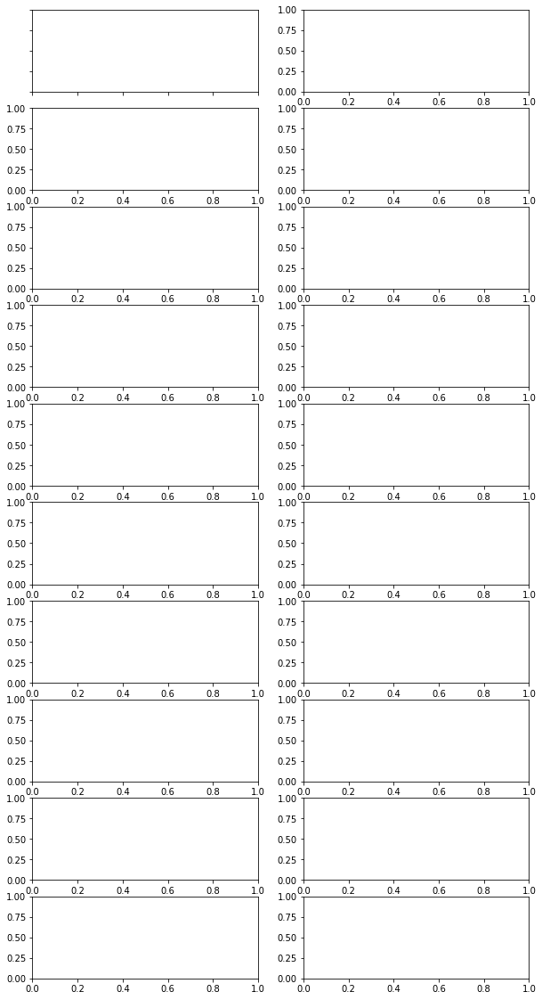

In [33]:
fig, axes = plt.subplots(nrows=10, ncols=2, figsize=(10, 20))

for oneshot, ax in zip(oneshots[:len(axes.flatten())], axes.flatten()):
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    ax.plot(oneshot)

Most samples have a long tail or leading portion of audio which is useless for classification and is unecessary data.

We can trim our samples using librosa's trim function.

Below we take the same samples and trim them.

In [ ]:
fig, axes = plt.subplots(nrows=20, ncols=1, figsize=(5, 50))

for oneshot, ax in zip(oneshots[:len(axes.flatten())], axes.flatten()):
    
    trimmed_oneshot, index = librosa.effects.trim(oneshot, top_db=25)
    
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    ax.set_title(f"{len(oneshot)} {len(trimmed_oneshot)}")
    ax.plot(trimmed_oneshot)